In [1]:
import pandas as pd
import netwulf as nw
import datamapplot as dmp
import networkx as nx
from itertools import combinations
import numpy as np
import re

In [2]:
df_gene_path = pd.read_csv("data/input/ddg2p_db.csv")
print(df_gene_path.shape)

(47809, 16)


In [3]:
df_gene_path.pmid.nunique()

44508

In [4]:
empty_counts = (df_gene_path.isna() | (df_gene_path == '')).sum()
print(empty_counts)

Unnamed: 0                                    0
title                                         0
abstract                                   7230
journal                                       0
authors                                      56
pubdate                                       0
pmid                                          0
references                                26394
gene                                          0
g2p_diseases                                  0
GO_Biological_Process_highest_rank_set     3656
GO_Molecular_Function_highest_rank_set     9945
Reactome_Pathways_highest_rank_set         7880
full_text                                 23257
hpo_ids                                   12756
unweighted_hpo_ids                        12756
dtype: int64


In [5]:
df_gene_path.columns

Index(['Unnamed: 0', 'title', 'abstract', 'journal', 'authors', 'pubdate',
       'pmid', 'references', 'gene', 'g2p_diseases',
       'GO_Biological_Process_highest_rank_set',
       'GO_Molecular_Function_highest_rank_set',
       'Reactome_Pathways_highest_rank_set', 'full_text', 'hpo_ids',
       'unweighted_hpo_ids'],
      dtype='object')

In [9]:
df_gene_path.head()

,Unnamed: 0,title,abstract,journal,authors,pubdate,pmid,references,gene,g2p_diseases,GO_Biological_Process_highest_rank_set,GO_Molecular_Function_highest_rank_set,Reactome_Pathways_highest_rank_set,full_text,hpo_ids,unweighted_hpo_ids
0,0,Autosomal dominant spondylarthropathy due to a...,Osteoarthrosis represents a very common diseas...,Human mutation,Winterpacht|A|A|;Hilbert|M|M|;Schwarze|U|U|;Mu...,1994,7866404,NaN,COL2A1,G2P00037: COL2A1-related Kniest dysplasia;G2P0...,Skeletal System Development (GO:0001501),Protein Homodimerization Activity (GO:0042803),Developmental Biology,NaN,NaN,NaN
1,1,Phenylketonuria in southern Poland: a new spli...,NaN,Human mutation,Zygulska|M|M|;Eigel|A|A|;Pietrzyk|J J|JJ|;Hors...,1994,7866411,NaN,PAH,G2P00275: PAH-related non-phenylketonuria hype...,Catecholamine Biosynthetic Process (GO:0042423),NaN,Diseases of Metabolism,NaN,NaN,NaN
2,2,Elongated CAG repeats of the B37 gene in a Dan...,Dentato-rubro-pallido-luysian atrophy (DR-PLA)...,Human genetics,Nørremølle|A|A|;Nielsen|J E|JE|;Sørensen|S A|S...,1995,7868125,8136826;1302002;8012381;8136840;6808417;334421...,ATN1,"G2P02647: ATN1-related congenital hypotonia, e...",Central Nervous System Development (GO:0007417),NaN,Signal Transduction,NaN,HP:0001250;HP:0001250;HP:0001250;HP:0001250;HP...,HP:0008110;HP:0001252;HP:0000473;HP:0011500;HP...
3,3,A novel mutation in the fibrillin gene (FBN1) ...,Mutations of the fibrillin gene (FBN1) are kno...,Molecular and cellular probes,Hayward|C|C|;Porteous|M E|ME|;Brock|D J|DJ|,1994,7870075,NaN,FBN1,G2P01013: FBN1-related Marfan syndrome;G2P0156...,Eye Development (GO:0001654),Metal Ion Binding (GO:0046872),Metabolism of Proteins,S0890-8508(84)71045-0 A novel mutation in th...,HP:0001166;HP:0001166;HP:0001166;HP:0001166;HP...,HP:0001166;HP:0001083;HP:0001519
4,4,RET proto-oncogene mutations in French MEN 2A ...,Constitutional mutations of the RET proto-onco...,Human molecular genetics,Schuffenecker|I|I|;Billaud|M|M|;Calender|A|A|;...,1994,7874109,NaN,RET,G2P00680: RET-related multiple endocrine neopl...,Positive Regulation of RNA Biosynthetic Proces...,Transmembrane Receptor Protein Tyrosine Kinase...,Developmental Biology,NaN,NaN,NaN


## Create new columns for plotting

In [6]:
def clean_disease(text):
    # aim is to have a more harmonized columnd for the disease values -> large heterogeneity and number of categories otherwise
    if pd.isna(text) or text.lower() == 'unlabeled':
        return 'Unknown Class'

    text = str(text).strip()

    # Step 1: If "-Onset" is in the text, get the first word after it
    match = re.search(r'\b\w+-Onset\s+(\w+)', text, flags=re.IGNORECASE)
    if match:
        return match.group(1).strip().title()

    # Step 2: Extract after colon (if present)
    after_colon = text.split(':', 1)[-1].strip()

    # Step 3: Remove leading gene name or "-related"
    after_gene = re.sub(r'^\w+(?:-related)?\s+', '', after_colon, flags=re.IGNORECASE)

    # Step 4: Cut off anything after "with"
    main_disease = re.split(r'\s+with\s+', after_gene, flags=re.IGNORECASE)[0]

    # Step 5: Title case
    disease = main_disease.strip().title()

    # Step 6: If ends with a comma and looks like reversed label, flip it
    if disease.endswith(','):
        parts = disease[:-1].split(',')
        if len(parts) == 2:
            disease = f"{parts[1].strip()} {parts[0].strip()}"

    return disease

In [11]:
def process_gene_pathways(
    df: pd.DataFrame,
    reactome_col: str = 'reactome_pathways',
    go_bp_col: str = 'GO_biological_process',
    go_mf_col: str = 'GO_molecular_function',
    disease_col: str = 'g2p_diseases',
    fill_na_with_str: str = 'unlabeled'
) -> pd.DataFrame:
    """
    Processes a DataFrame containing gene, pathway, GO annotation, and disease data.

    Adds parsed and cleaned columns for:
      - Reactome pathway hierarchy (top two levels)
      - GO biological process and molecular function hierarchy (top two levels, cleaned)
      - Disease (top level, cleaned)
      - Combined text annotations (PMID/title/gene/pathway/GO/disease)

    Parameters:
        df (pd.DataFrame): Input DataFrame. Must contain at least the following columns (or their custom equivalents):
            - reactome pathways column (default name: 'reactome_pathways')
            - GO biological process column (default name: 'GO_biological_process')
            - GO molecular function column (default name: 'GO_molecular_function')
            - disease column (default name: 'g2p_diseases')
            - 'pmid', 'title', 'gene' (these remain hard-coded since they are used directly)
        reactome_col (str): Name of the column containing Reactome pathway strings.
        go_bp_col (str): Name of the column containing GO biological process strings.
        go_mf_col (str): Name of the column containing GO molecular function strings.
        disease_col (str): Name of the column containing disease (g2p) strings.
        fill_na_with_str (str): Value to fill in where any of the above columns are NaN.

    Returns:
        pd.DataFrame: The same DataFrame with the following new columns:
            - highest_level_path
            - second_level_path
            - pmid_title
            - pmid_title_gene_path
            - pmid_title_gene
            - GO_biological_process_first
            - GO_biological_process_second
            - pmid_title_gene_go_process
            - GO_molecular_function_first
            - GO_molecular_function_second
            - g2p_diseases_first
            - disease
            - pmid_title_disease
    """

    # 1) Reactome pathways
    df[reactome_col] = df[reactome_col].fillna(fill_na_with_str).astype(str)
    df['highest_level_path'] = df[reactome_col].apply(lambda x: x.split(";")[0])
    df['second_level_path'] = df[reactome_col].apply(
        lambda x: x.split(";")[1] if ";" in x else x.split(";")[0]
    )

    # 2) PMID/title/gene combinations
    df['pmid_title'] = df['pmid'].astype(str) + ": " + df['title'].astype(str)
    df['pmid_title_gene_path'] = df.apply(
        lambda row: f"{row['pmid']}: {row['title']}; Gene: {row['gene']}; Path: {row['highest_level_path']}",
        axis=1
    )
    df['pmid_title_gene'] = df.apply(
        lambda row: f"{row['pmid']}: {row['title']}; Gene: {row['gene']}",
        axis=1
    )

    # 3) GO biological process
    df[go_bp_col] = df[go_bp_col].fillna(fill_na_with_str).astype(str)
    df['GO_biological_process_first'] = df[go_bp_col].apply(lambda x: x.split(";")[0])
    df['GO_biological_process_second'] = df[go_bp_col].apply(
        lambda x: x.split(";")[1] if ";" in x else x.split(";")[0]
    )

    # Remove trailing "(GO:####)" from GO names
    df['GO_biological_process_first'] = df['GO_biological_process_first'].str.replace(
        r'\s*\(GO:\d+\)', '', regex=True
    )
    df['GO_biological_process_second'] = df['GO_biological_process_second'].str.replace(
        r'\s*\(GO:\d+\)', '', regex=True
    )

    df['pmid_title_gene_go_process'] = df.apply(
        lambda row: f"{row['pmid']}: {row['title']}; Gene: {row['gene']}; Process: {row['GO_biological_process_first']}",
        axis=1
    )

    # 4) GO molecular function
    df[go_mf_col] = df[go_mf_col].fillna(fill_na_with_str).astype(str)
    df['GO_molecular_function_first'] = df[go_mf_col].apply(lambda x: x.split(";")[0])
    df['GO_molecular_function_second'] = df[go_mf_col].apply(
        lambda x: x.split(";")[1] if ";" in x else x.split(";")[0]
    )

    # Remove trailing "(GO:####)" from GO names
    df['GO_molecular_function_first'] = df['GO_molecular_function_first'].str.replace(
        r'\s*\(GO:\d+\)', '', regex=True
    )
    df['GO_molecular_function_second'] = df['GO_molecular_function_second'].str.replace(
        r'\s*\(GO:\d+\)', '', regex=True
    )

    # 5) Diseases (g2p)
    df[disease_col] = df[disease_col].fillna(fill_na_with_str).astype(str)
    df['g2p_diseases_first'] = df[disease_col].apply(lambda x: x.split(";")[0])
    df['disease'] = df['g2p_diseases_first'].apply(clean_disease)

    df['pmid_title_disease'] = df.apply(
        lambda row: f"{row['pmid']}: {row['title']}; Gene: {row['gene']}; Disease: {row['disease']}",
        axis=1
    )

    return df

In [12]:
df_gene_path = process_gene_pathways(
    df_gene_path,
    reactome_col='Reactome_Pathways_highest_rank_set',
    go_bp_col='GO_Biological_Process_highest_rank_set',
    go_mf_col='GO_Molecular_Function_highest_rank_set',
    disease_col='g2p_diseases',
    fill_na_with_str='Unknown Class'
)

In [13]:
df_gene_path.head()

,Unnamed: 0,title,abstract,journal,authors,pubdate,pmid,references,gene,g2p_diseases,...,pmid_title_gene_path,pmid_title_gene,GO_biological_process_first,GO_biological_process_second,pmid_title_gene_go_process,GO_molecular_function_first,GO_molecular_function_second,g2p_diseases_first,disease,pmid_title_disease
0,0,Autosomal dominant spondylarthropathy due to a...,Osteoarthrosis represents a very common diseas...,Human mutation,Winterpacht|A|A|;Hilbert|M|M|;Schwarze|U|U|;Mu...,1994,7866404,NaN,COL2A1,G2P00037: COL2A1-related Kniest dysplasia;G2P0...,...,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,Skeletal System Development,Skeletal System Development,7866404: Autosomal dominant spondylarthropathy...,Protein Homodimerization Activity,Protein Homodimerization Activity,G2P00037: COL2A1-related Kniest dysplasia,Kniest Dysplasia,7866404: Autosomal dominant spondylarthropathy...
1,1,Phenylketonuria in southern Poland: a new spli...,NaN,Human mutation,Zygulska|M|M|;Eigel|A|A|;Pietrzyk|J J|JJ|;Hors...,1994,7866411,NaN,PAH,G2P00275: PAH-related non-phenylketonuria hype...,...,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,Catecholamine Biosynthetic Process,Catecholamine Biosynthetic Process,7866411: Phenylketonuria in southern Poland: a...,Unknown Class,Unknown Class,G2P00275: PAH-related non-phenylketonuria hype...,Non-Phenylketonuria Hyperphenylalaninemia,7866411: Phenylketonuria in southern Poland: a...
2,2,Elongated CAG repeats of the B37 gene in a Dan...,Dentato-rubro-pallido-luysian atrophy (DR-PLA)...,Human genetics,Nørremølle|A|A|;Nielsen|J E|JE|;Sørensen|S A|S...,1995,7868125,8136826;1302002;8012381;8136840;6808417;334421...,ATN1,"G2P02647: ATN1-related congenital hypotonia, e...",...,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,Central Nervous System Development,Central Nervous System Development,7868125: Elongated CAG repeats of the B37 gene...,Unknown Class,Unknown Class,"G2P02647: ATN1-related congenital hypotonia, e...","Congenital Hypotonia, Epilepsy, Developmental ...",7868125: Elongated CAG repeats of the B37 gene...
3,3,A novel mutation in the fibrillin gene (FBN1) ...,Mutations of the fibrillin gene (FBN1) are kno...,Molecular and cellular probes,Hayward|C|C|;Porteous|M E|ME|;Brock|D J|DJ|,1994,7870075,NaN,FBN1,G2P01013: FBN1-related Marfan syndrome;G2P0156...,...,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,Eye Development,Eye Development,7870075: A novel mutation in the fibrillin gen...,Metal Ion Binding,Metal Ion Binding,G2P01013: FBN1-related Marfan syndrome,Marfan Syndrome,7870075: A novel mutation in the fibrillin gen...
4,4,RET proto-oncogene mutations in French MEN 2A ...,Constitutional mutations of the RET proto-onco...,Human molecular genetics,Schuffenecker|I|I|;Billaud|M|M|;Calender|A|A|;...,1994,7874109,NaN,RET,G2P00680: RET-related multiple endocrine neopl...,...,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,Positive Regulation of RNA Biosynthetic Process,Positive Regulation of RNA Biosynthetic Process,7874109: RET proto-oncogene mutations in Frenc...,Transmembrane Receptor Protein Tyrosine Kinase...,Transmembrane Receptor Protein Tyrosine Kinase...,G2P00680: RET-related multiple endocrine neopl...,Multiple Endocrine Neoplasia Iib,7874109: RET proto-oncogene mutations in Frenc...


In [14]:
df_gene_path.columns

Index(['Unnamed: 0', 'title', 'abstract', 'journal', 'authors', 'pubdate',
       'pmid', 'references', 'gene', 'g2p_diseases',
       'GO_Biological_Process_highest_rank_set',
       'GO_Molecular_Function_highest_rank_set',
       'Reactome_Pathways_highest_rank_set', 'full_text', 'hpo_ids',
       'unweighted_hpo_ids', 'highest_level_path', 'second_level_path',
       'pmid_title', 'pmid_title_gene_path', 'pmid_title_gene',
       'GO_biological_process_first', 'GO_biological_process_second',
       'pmid_title_gene_go_process', 'GO_molecular_function_first',
       'GO_molecular_function_second', 'g2p_diseases_first', 'disease',
       'pmid_title_disease'],
      dtype='object')

In [15]:
df_gene_path.GO_biological_process_first.nunique(),df_gene_path.GO_biological_process_second.nunique(), df_gene_path.GO_molecular_function_first.nunique()

(513, 513, 354)

In [36]:
df_gene_path['GO_biological_process_first'].value_counts()

GO_biological_process_first
Unknown Class                                           3656
Positive Regulation of RNA Biosynthetic Process         3442
Skeletal System Development                             2383
Positive Regulation of DNA-templated Transcription      2206
Eye Development                                         1720
                                                        ... 
Negative Regulation of Response to External Stimulus       1
Positive Regulation of ERBB Signaling Pathway              1
Carbohydrate Derivative Biosynthetic Process               1
Proline Metabolic Process                                  1
Negative Regulation of Endothelial Cell Migration          1
Name: count, Length: 513, dtype: int64

In [37]:
df_gene_path['GO_biological_process_first'].nunique()

513

In [ ]:
df_gene_path['GO_molecular_function_first'].value_counts()

In [35]:
df_gene_path['disease'].nunique()

1373

In [50]:
df_gene_path['disease'].value_counts()

disease
Intellectual Developmental Disorder                                                      1166
Intellectual Disability                                                                  1149
Marfan Syndrome                                                                           858
Neurodevelopmental Disorder                                                               844
Developmental Disorder                                                                    799
                                                                                         ... 
Craniofacial-Neurodevelopmental Disorder                                                    1
Colobomatous Microphthalmia, Microcephaly, Intellectual Disability, And Short Stature       1
Severe Intellectual Disability Syndrome                                                     1
Acute Hepatic Porphyria                                                                     1
Primary Ciliary Dyskinesia Associated               

In [19]:
# Count occurrences of each gene
gene_counts = df_gene_path['gene'].value_counts()

In [20]:
gene_counts

gene
FBN1       858
ABCD1      747
NF1        544
MECP2      404
HNF4A      374
          ... 
PGM2L1       1
SLC35B2      1
CRIM1        1
TMEM237      1
ERMARD       1
Name: count, Length: 2375, dtype: int64

In [21]:
df_gene_path['highest_level_path'].value_counts()

highest_level_path
Unknown Class                                                            7880
Metabolism                                                               7215
Disease                                                                  4901
Developmental Biology                                                    4698
Metabolism of Proteins                                                   2220
                                                                         ... 
Signaling by PDGF                                                           4
Lectin Pathway of Complement Activation                                     3
Factors Involved in Megakaryocyte Development and Platelet Production       3
Negative Regulators of DDX58 IFIH1 Signaling                                2
Circadian Clock                                                             2
Name: count, Length: 108, dtype: int64

In [22]:
#df_gene_path = df_gene_path.drop_duplicates(subset='pmid', keep='first')
df_gene_path.shape

(47809, 29)

In [23]:
duplicated_rows = df_gene_path[df_gene_path.duplicated(subset='pmid', keep=False)]
duplicated_rows.head(5)

,Unnamed: 0,title,abstract,journal,authors,pubdate,pmid,references,gene,g2p_diseases,...,pmid_title_gene_path,pmid_title_gene,GO_biological_process_first,GO_biological_process_second,pmid_title_gene_go_process,GO_molecular_function_first,GO_molecular_function_second,g2p_diseases_first,disease,pmid_title_disease
33,33,CDH1-related blepharocheilodontic syndrome is ...,We report the first case of diffuse gastric ca...,American journal of medical genetics. Part A,LeBlanc|Shannon|S|0000-0002-3396-9454;Naveen|D...,2020,32302040,NaN,FZR1,G2P03223: FZR1-related intellectual disability...,...,32302040: CDH1-related blepharocheilodontic sy...,32302040: CDH1-related blepharocheilodontic sy...,Positive Regulation of RNA Biosynthetic Process,Positive Regulation of RNA Biosynthetic Process,32302040: CDH1-related blepharocheilodontic sy...,Ankyrin Binding,Ankyrin Binding,G2P03223: FZR1-related intellectual disability...,Intellectual Disability And Epilepsy,32302040: CDH1-related blepharocheilodontic sy...
34,34,CDH1-related blepharocheilodontic syndrome is ...,We report the first case of diffuse gastric ca...,American journal of medical genetics. Part A,LeBlanc|Shannon|S|0000-0002-3396-9454;Naveen|D...,2020,32302040,NaN,CDH1,G2P01974: CDH1-related blepharo-cheiro-dontic ...,...,32302040: CDH1-related blepharocheilodontic sy...,32302040: CDH1-related blepharocheilodontic sy...,Skeletal System Development,Skeletal System Development,32302040: CDH1-related blepharocheilodontic sy...,Cadherin Binding,Cadherin Binding,G2P01974: CDH1-related blepharo-cheiro-dontic ...,Blepharo-Cheiro-Dontic Syndrome,32302040: CDH1-related blepharocheilodontic sy...
55,55,First comprehensive TSC1/TSC2 mutational analy...,The aim of this study was to improve knowledge...,Scientific reports,Reyna-Fabián|Miriam E|ME|;Hernández-Martínez|N...,2020,32313033,21520333;12049200;29196670;18854862;29378663;1...,TSC1,G2P01270: TSC1-related tuberous sclerosis,...,32313033: First comprehensive TSC1/TSC2 mutati...,32313033: First comprehensive TSC1/TSC2 mutati...,Negative Regulation of Cell Population Prolife...,Negative Regulation of Cell Population Prolife...,32313033: First comprehensive TSC1/TSC2 mutati...,Hsp90 Protein Binding,Hsp90 Protein Binding,G2P01270: TSC1-related tuberous sclerosis,Tuberous Sclerosis,32313033: First comprehensive TSC1/TSC2 mutati...
56,56,First comprehensive TSC1/TSC2 mutational analy...,The aim of this study was to improve knowledge...,Scientific reports,Reyna-Fabián|Miriam E|ME|;Hernández-Martínez|N...,2020,32313033,21520333;12049200;29196670;18854862;29378663;1...,TSC2,G2P01636: TSC2-related tuberous sclerosis,...,32313033: First comprehensive TSC1/TSC2 mutati...,32313033: First comprehensive TSC1/TSC2 mutati...,Insulin-Like Growth Factor Receptor Signaling ...,Insulin-Like Growth Factor Receptor Signaling ...,32313033: First comprehensive TSC1/TSC2 mutati...,Protein Homodimerization Activity,Protein Homodimerization Activity,G2P01636: TSC2-related tuberous sclerosis,Tuberous Sclerosis,32313033: First comprehensive TSC1/TSC2 mutati...
82,82,Increased prevalence of kidney cysts in indivi...,BACKGROUND\nClinical variability among individ...,"Nephrology, dialysis, transplantation : offici...",Furlano|Mónica|M|0000-0003-1025-3901;Pilco-Ter...,2024,38317457,33532864;35602506;30819518;11097395;1987597;12...,COL4A3,G2P00950: COL4A3-related Alport syndrome;G2P01...,...,38317457: Increased prevalence of kidney cysts...,38317457: Increased prevalence of kidney cysts...,Sensory Perception of Sound,Sensory Perception of Sound,38317457: Increased prevalence of kidney cysts...,Metalloendopeptidase Inhibitor Activity,Metalloendopeptidase Inhibitor Activity,G2P00950: COL4A3-related Alport syndrome,Alport Syndrome,38317457: Increased prevalence of kidney cysts...


## GO Bio Process

In [24]:
# the visualization doesn't work well when the number are very high
def scale_xy(df, x_col, y_col, new_min=-12, new_max=12):
    # Extract x and y values
    xy = df[[x_col, y_col]].values

    # Scale
    xy_min = xy.min()
    xy_max = xy.max()
    xy_scaled = new_min + ((xy - xy_min) / (xy_max - xy_min)) * (new_max - new_min)

    # Update the DataFrame
    df[x_col] = xy_scaled[:, 0]
    df[y_col] = xy_scaled[:, 1]

    return df

### go-process -> articles

In [25]:
df_pubs_for_graph = df_gene_path.copy()
# to allow for an article to appear several times in association with different genes
# use 
df_pubs_for_graph['pmid_gene'] = (
    'PMID:' + df_pubs_for_graph['pmid'].astype(str) + 
    '|GENE:' + df_pubs_for_graph['gene']
)
df_pubs_for_graph.shape

(47809, 30)

In [26]:
df_pubs_for_graph.columns

Index(['Unnamed: 0', 'title', 'abstract', 'journal', 'authors', 'pubdate',
       'pmid', 'references', 'gene', 'g2p_diseases',
       'GO_Biological_Process_highest_rank_set',
       'GO_Molecular_Function_highest_rank_set',
       'Reactome_Pathways_highest_rank_set', 'full_text', 'hpo_ids',
       'unweighted_hpo_ids', 'highest_level_path', 'second_level_path',
       'pmid_title', 'pmid_title_gene_path', 'pmid_title_gene',
       'GO_biological_process_first', 'GO_biological_process_second',
       'pmid_title_gene_go_process', 'GO_molecular_function_first',
       'GO_molecular_function_second', 'g2p_diseases_first', 'disease',
       'pmid_title_disease', 'pmid_gene'],
      dtype='object')

In [27]:
G = nx.Graph()

for _, row in df_pubs_for_graph.iterrows():
    pmid_gene_node = f"PMID:{row['pmid']}|GENE:{row['gene']}"
    go_node = f"Biological Process:{row['GO_biological_process_first']}"
    
    G.add_node(pmid_gene_node, type="PMID_GENE")
    G.add_node(go_node, type="Biological_Process")
    
    G.add_edge(pmid_gene_node, go_node, label="involved_in")

The below code will open a new browser window where the graph can be viewed and modified. By clicking "save to python" the window will be closed, and the resulting node positions and styling are returned and saved to a JSON file for later use..

/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(
/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(


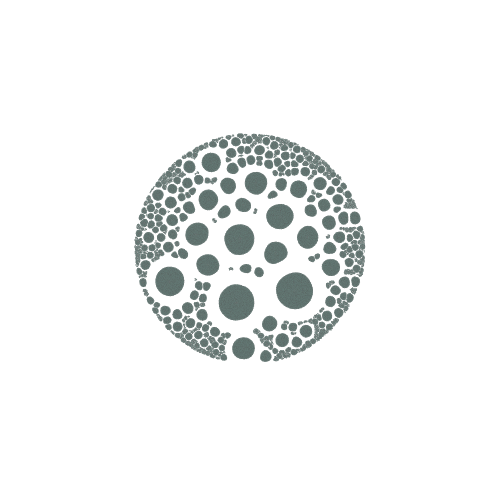

In [28]:
stylized_network, config = nw.visualize(G)

positions = {}
for node in stylized_network['nodes']:
    node_id = node['id']  # This is the node name, like 'PMID:123456'
    positions[node_id] = (node['x'], node['y'])
    
nw.save("netwulf_network_publications.json", stylized_network, config, G)

In [29]:
pos_df = pd.DataFrame([
    {
        'pmid_gene': key,
        'x_go_process': x,
        'y_go_process': y
    }
    for key, (x, y) in positions.items()
    if key.startswith('PMID:')
])
#pos_df['pmid'] = pos_df['pmid'].astype(int)
df_with_pos = df_pubs_for_graph.merge(pos_df, on='pmid_gene', how='left')
xy= df_with_pos[["x_go_process", "y_go_process"]].values
label_array = df_with_pos["GO_biological_process_first"].values
pmid_title = df_with_pos["pmid_title_gene_go_process"].values
genes_array = df_with_pos["gene"].values

xy_min = xy.min()
xy_max = xy.max()

xy_scaled = -10 + ((xy - xy_min) / (xy_max - xy_min)) * (10 - (-10))

In [30]:
pos_df.shape, df_with_pos.shape, df_pubs_for_graph.shape

((47809, 3), (47809, 32), (47809, 30))

<InteractiveFigure width=100% height=800>
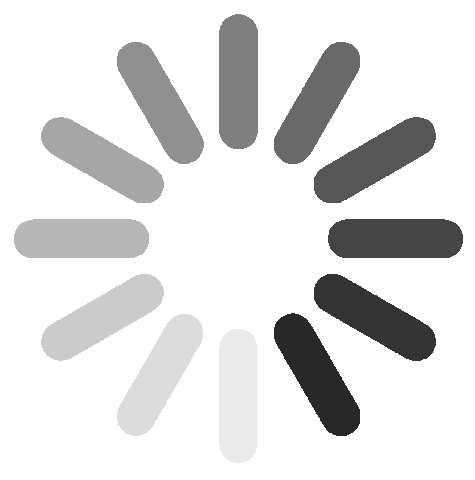

In [31]:
dmp.create_interactive_plot(
    xy_scaled,
    label_array,
    genes_array,
    hover_text=pmid_title,
    enable_search=True,
)

### save for dashboard

In [32]:
df_with_pos_go = df_with_pos[['pmid','title','pmid_gene','pmid_title_gene_path', 'pmid_title_gene_go_process', 'gene', 'disease', 'highest_level_path', 'GO_biological_process_first', 'pubdate', 'journal', 'x_go_process','y_go_process']]
df_with_pos_go = scale_xy(df_with_pos_go, 'x_go_process','y_go_process')
df_with_pos_go.head()

/var/folders/nd/2fzvhsh510gbt9x6z5pdb1gr0000gn/T/ipykernel_48722/1551460660.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[x_col] = xy_scaled[:, 0]
/var/folders/nd/2fzvhsh510gbt9x6z5pdb1gr0000gn/T/ipykernel_48722/1551460660.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[y_col] = xy_scaled[:, 1]


,pmid,title,pmid_gene,pmid_title_gene_path,pmid_title_gene_go_process,gene,disease,highest_level_path,GO_biological_process_first,pubdate,journal,x_go_process,y_go_process
0,7866404,Autosomal dominant spondylarthropathy due to a...,PMID:7866404|GENE:COL2A1,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,Kniest Dysplasia,Developmental Biology,Skeletal System Development,1994,Human mutation,-0.698466,-1.366203
1,7866411,Phenylketonuria in southern Poland: a new spli...,PMID:7866411|GENE:PAH,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,Non-Phenylketonuria Hyperphenylalaninemia,Diseases of Metabolism,Catecholamine Biosynthetic Process,1994,Human mutation,6.335828,-5.524163
2,7868125,Elongated CAG repeats of the B37 gene in a Dan...,PMID:7868125|GENE:ATN1,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,"Congenital Hypotonia, Epilepsy, Developmental ...",Signal Transduction,Central Nervous System Development,1995,Human genetics,0.874702,-7.217078
3,7870075,A novel mutation in the fibrillin gene (FBN1) ...,PMID:7870075|GENE:FBN1,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,Marfan Syndrome,Metabolism of Proteins,Eye Development,1994,Molecular and cellular probes,3.273770,-3.147037
4,7874109,RET proto-oncogene mutations in French MEN 2A ...,PMID:7874109|GENE:RET,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,Multiple Endocrine Neoplasia Iib,Developmental Biology,Positive Regulation of RNA Biosynthetic Process,1994,Human molecular genetics,-1.766012,5.799867


In [43]:
path='Actomyosin Structure Organization'
filtered_df = df_with_pos_go[df_with_pos_go['GO_biological_process_first'].isin([path])]
filtered_df

,pmid,title,pmid_gene,pmid_title_gene_path,pmid_title_gene_go_process,gene,disease,highest_level_path,GO_biological_process_first,pubdate,journal,x_go_process,y_go_process
6598,37392669,A Case Series of Patients With MYBPC1 Gene Var...,PMID:37392669|GENE:MYBPC1,37392669: A Case Series of Patients With MYBPC...,37392669: A Case Series of Patients With MYBPC...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2023,Pediatric neurology,-11.691493,-2.530288
7500,31264822,Heterozygous variants in MYBPC1 are associated...,PMID:31264822|GENE:MYBPC1,31264822: Heterozygous variants in MYBPC1 are ...,31264822: Heterozygous variants in MYBPC1 are ...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2019,Human mutation,-11.713019,-2.453715
8590,38185014,Congenital tremor and myopathy secondary to no...,PMID:38185014|GENE:MYBPC1,38185014: Congenital tremor and myopathy secon...,38185014: Congenital tremor and myopathy secon...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2024,Journal of the neurological sciences,-11.628484,-2.476286
8805,37093584,Ultrasonography of Muscle Vibration Caused by ...,PMID:37093584|GENE:MYBPC1,37093584: Ultrasonography of Muscle Vibration ...,37093584: Ultrasonography of Muscle Vibration ...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2023,JAMA neurology,-11.762054,-2.201390
14615,25748484,"A novel syndrome of Klippel-Feil anomaly, myop...",PMID:25748484|GENE:MYO18B,25748484: A novel syndrome of Klippel-Feil ano...,25748484: A novel syndrome of Klippel-Feil ano...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2015,Journal of medical genetics,-11.778092,-2.280124
17118,33179433,Further delineation of MYO18B-related autosoma...,PMID:33179433|GENE:MYO18B,33179433: Further delineation of MYO18B-relate...,33179433: Further delineation of MYO18B-relate...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2021,American journal of medical genetics. Part A,-11.582745,-2.146133
18245,26661508,Expanding the MYBPC1 phenotypic spectrum: a no...,PMID:26661508|GENE:MYBPC1,26661508: Expanding the MYBPC1 phenotypic spec...,26661508: Expanding the MYBPC1 phenotypic spec...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2016,Clinical genetics,-11.735465,-2.124302
24068,32184166,A novel pathogenic variant in MYO18B associati...,PMID:32184166|GENE:MYO18B,32184166: A novel pathogenic variant in MYO18B...,32184166: A novel pathogenic variant in MYO18B...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2020,Gene,-11.470201,-2.379356
26668,27858739,A Premature Stop Codon in MYO18B is Associated...,PMID:27858739|GENE:MYO18B,27858739: A Premature Stop Codon in MYO18B is ...,27858739: A Premature Stop Codon in MYO18B is ...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2015,Journal of neuromuscular diseases,-11.681296,-2.186377
29204,38690148,Expanding the Spectrum of Congenital Myopathy ...,PMID:38690148|GENE:MYBPC1,38690148: Expanding the Spectrum of Congenital...,38690148: Expanding the Spectrum of Congenital...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2024,Neurology. Clinical practice,-11.653825,-2.109849


In [41]:
df_with_pos_go[df_with_pos_go['GO_biological_process_first']=='Actomyosin Structure Organization']

,pmid,title,pmid_gene,pmid_title_gene_path,pmid_title_gene_go_process,gene,disease,highest_level_path,GO_biological_process_first,pubdate,journal,x_go_process,y_go_process
6598,37392669,A Case Series of Patients With MYBPC1 Gene Var...,PMID:37392669|GENE:MYBPC1,37392669: A Case Series of Patients With MYBPC...,37392669: A Case Series of Patients With MYBPC...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2023,Pediatric neurology,-11.691493,-2.530288
7500,31264822,Heterozygous variants in MYBPC1 are associated...,PMID:31264822|GENE:MYBPC1,31264822: Heterozygous variants in MYBPC1 are ...,31264822: Heterozygous variants in MYBPC1 are ...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2019,Human mutation,-11.713019,-2.453715
8590,38185014,Congenital tremor and myopathy secondary to no...,PMID:38185014|GENE:MYBPC1,38185014: Congenital tremor and myopathy secon...,38185014: Congenital tremor and myopathy secon...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2024,Journal of the neurological sciences,-11.628484,-2.476286
8805,37093584,Ultrasonography of Muscle Vibration Caused by ...,PMID:37093584|GENE:MYBPC1,37093584: Ultrasonography of Muscle Vibration ...,37093584: Ultrasonography of Muscle Vibration ...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2023,JAMA neurology,-11.762054,-2.201390
14615,25748484,"A novel syndrome of Klippel-Feil anomaly, myop...",PMID:25748484|GENE:MYO18B,25748484: A novel syndrome of Klippel-Feil ano...,25748484: A novel syndrome of Klippel-Feil ano...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2015,Journal of medical genetics,-11.778092,-2.280124
17118,33179433,Further delineation of MYO18B-related autosoma...,PMID:33179433|GENE:MYO18B,33179433: Further delineation of MYO18B-relate...,33179433: Further delineation of MYO18B-relate...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2021,American journal of medical genetics. Part A,-11.582745,-2.146133
18245,26661508,Expanding the MYBPC1 phenotypic spectrum: a no...,PMID:26661508|GENE:MYBPC1,26661508: Expanding the MYBPC1 phenotypic spec...,26661508: Expanding the MYBPC1 phenotypic spec...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2016,Clinical genetics,-11.735465,-2.124302
24068,32184166,A novel pathogenic variant in MYO18B associati...,PMID:32184166|GENE:MYO18B,32184166: A novel pathogenic variant in MYO18B...,32184166: A novel pathogenic variant in MYO18B...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2020,Gene,-11.470201,-2.379356
26668,27858739,A Premature Stop Codon in MYO18B is Associated...,PMID:27858739|GENE:MYO18B,27858739: A Premature Stop Codon in MYO18B is ...,27858739: A Premature Stop Codon in MYO18B is ...,MYO18B,Klippel-Feil Syndrome,Unknown Class,Actomyosin Structure Organization,2015,Journal of neuromuscular diseases,-11.681296,-2.186377
29204,38690148,Expanding the Spectrum of Congenital Myopathy ...,PMID:38690148|GENE:MYBPC1,38690148: Expanding the Spectrum of Congenital...,38690148: Expanding the Spectrum of Congenital...,MYBPC1,Arthrogryposis And Myopathy,Muscle Contraction,Actomyosin Structure Organization,2024,Neurology. Clinical practice,-11.653825,-2.109849


In [33]:
df_with_pos_go.to_csv("data/output/df_for_dashboard.csv", index=False)

## Other viz experiments

### path -> articles

In [1398]:
df_pubs_for_graph = df_gene_path.copy()
df_pubs_for_graph = df_pubs_for_graph.drop_duplicates(subset='pmid', keep='first')

df_pubs_for_graph.shape

(44508, 16)

In [1400]:
# Initialize the graph
G = nx.Graph()

for _, row in df_pubs_for_graph.iterrows():
    pmid_node = f"PMID:{row['pmid']}"
    pathway_node = f"Pathway:{row['highest_level_path']}"
    G.add_node(pmid_node, type="PMID")
    G.add_node(pathway_node, type="Pathway")
    G.add_edge(pmid_node, pathway_node, label="involved_in")

In [1401]:
count=0
for node, edge in zip(G.nodes(), G.edges()):
    print(node, edge)
    count+=1
    if count==10:
        break

PMID:7866404 ('PMID:7866404', 'Pathway:Developmental Biology')
Pathway:Developmental Biology ('Pathway:Developmental Biology', 'PMID:7874109')
PMID:7866411 ('Pathway:Developmental Biology', 'PMID:7874167')
Pathway:Metabolism ('Pathway:Developmental Biology', 'PMID:7875294')
PMID:7868125 ('Pathway:Developmental Biology', 'PMID:7881414')
Pathway:Signal Transduction ('Pathway:Developmental Biology', 'PMID:7881422')
PMID:7870075 ('Pathway:Developmental Biology', 'PMID:7881431')
Pathway:Metabolism of Proteins ('Pathway:Developmental Biology', 'PMID:32303391')
PMID:7874109 ('Pathway:Developmental Biology', 'PMID:32311999')
PMID:7874167 ('Pathway:Developmental Biology', 'PMID:32314541')


In [1404]:
target_node = 'PMID:23603762'

if target_node in G:
    neighbors = list(G.neighbors(target_node))
    print(f"Nodes connected to {target_node}:")
    for n in neighbors:
        print(n)
else:
    print(f"{target_node} not found in the graph.")


Nodes connected to PMID:23603762:
Pathway:Signal Transduction


/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(
/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(


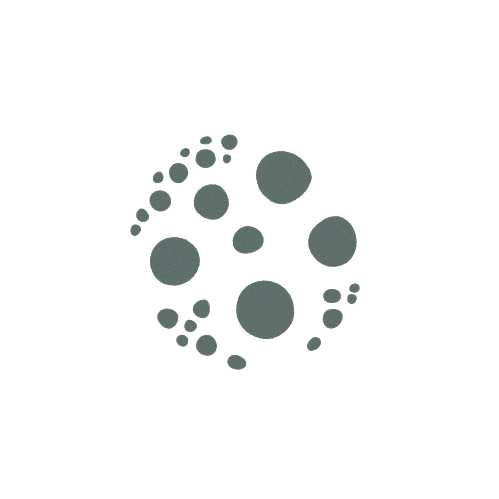

In [1406]:
stylized_network, config = nw.visualize(G)

positions = {}
for node in stylized_network['nodes']:
    node_id = node['id']  # This is the node name, like 'PMID:123456'
    positions[node_id] = (node['x'], node['y'])
    
nw.save("netwulf_network_publications.json", stylized_network, config, G)

In [1408]:
pos_df = pd.DataFrame([
    {'pmid': key.replace('PMID:', ''), 'x': x, 'y': y}
    for key, (x, y) in positions.items()
    if key.startswith('PMID:')
])
pos_df['pmid'] = pos_df['pmid'].astype(int)
df_with_pos = df_pubs_for_graph.merge(pos_df, on='pmid', how='left')
xy= df_with_pos[["x", "y"]].values
label_array = df_with_pos["highest_level_path"].values
pmid_title = df_with_pos["pmid_title_gene"].values
genes_array = df_with_pos["gene"].values

xy_min = xy.min()
xy_max = xy.max()

xy_scaled = -10 + ((xy - xy_min) / (xy_max - xy_min)) * (10 - (-10))

,pmid,x,y
0,7866404,-273.308902,532.034614
1,7866411,586.274448,1018.047271
2,7868125,456.167207,366.801674
3,7870075,106.552594,-26.261648
4,7874109,-287.910642,573.172247


In [1410]:
df_with_pos = df_pubs_for_graph.merge(pos_df, on='pmid', how='left')
xy= df_with_pos[["x", "y"]].values
label_array = df_with_pos["highest_level_path"].values
pmid_title = df_with_pos["pmid_title_gene"].values
genes_array = df_with_pos["gene"].values

xy_min = xy.min()
xy_max = xy.max()

xy_scaled = -10 + ((xy - xy_min) / (xy_max - xy_min)) * (10 - (-10))

<InteractiveFigure width=100% height=800>
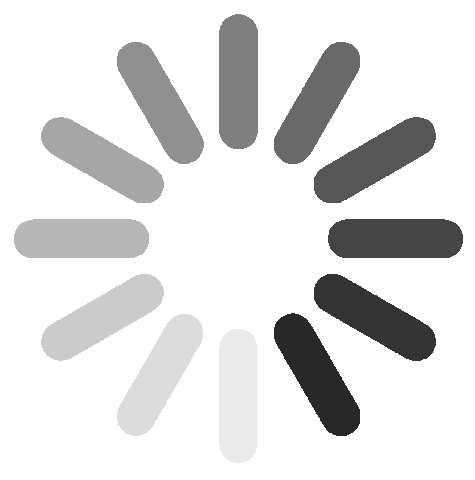

In [1412]:
dmp.create_interactive_plot(
    xy_scaled,
    label_array,
    genes_array,
    hover_text=pmid_title,
    enable_search=True,
)

### hierarchical path -> gene

In [57]:
df_pubs_for_graph = df_gene_path.copy()

df_gene_path_min = df_pubs_for_graph[['pmid','pmid_title', 'pmid_title_gene', 'gene', 'highest_level_path', 'second_level_path']]

In [59]:
df_pubs_for_graph.shape

(44508, 16)

In [83]:
G = nx.Graph()

for _, row in df_pubs_for_graph.iterrows():
    pmid_node = f"PMID:{row['pmid']}"
    gene_node = f"Gene:{row['gene']}"
    pathway_node = f"Pathway:{row['second_level_path']}"

    G.add_node(pmid_node, type='PMID', title=row['pmid_title'])
    G.add_node(gene_node, type='Gene', label=row['gene'])
    G.add_node(pathway_node, type='Pathway', label=row['second_level_path'])

    G.add_edge(pmid_node, gene_node, label='mentions_gene')
    G.add_edge(gene_node, pathway_node, label='in_pathway')

In [85]:
count=0
for node, edge in zip(G.nodes(), G.edges()):
    print(node, edge)
    count+=1
    if count==10:
        break

PMID:7866404 ('PMID:7866404', 'Gene:COL2A1')
Gene:COL2A1 ('Gene:COL2A1', 'Pathway:Signal Transduction')
Pathway:Signal Transduction ('Gene:COL2A1', 'PMID:21924244')
PMID:7866411 ('Gene:COL2A1', 'PMID:27059630')
Gene:PAH ('Gene:COL2A1', 'PMID:23928235')
Pathway:Diseases of Metabolism ('Gene:COL2A1', 'PMID:23932928')
PMID:7868125 ('Gene:COL2A1', 'PMID:11708863')
Gene:ATN1 ('Gene:COL2A1', 'PMID:32896647')
Pathway:Intracellular Signaling by Second Messengers ('Gene:COL2A1', 'PMID:25604898')
PMID:7870075 ('Gene:COL2A1', 'PMID:2339128')


In [87]:
def get_pmid_details(G, pmid):
    """
    Given a NetworkX graph and a PMID (as int or str), 
    returns information about the genes and pathways associated with that PMID.
    """
    target_pmid = f"PMID:{pmid}"

    if target_pmid not in G:
        print(f"{target_pmid} not found in graph.")
        return

    # Get PMID node title
    title = G.nodes[target_pmid].get("title", "No title available")

    # Get connected genes
    connected_genes = [n for n in G.neighbors(target_pmid) if G.nodes[n].get('type') == 'Gene']

    # Get associated pathways through the genes
    pathways = set()
    for gene in connected_genes:
        for neighbor in G.neighbors(gene):
            if G.nodes[neighbor].get('type') == 'Pathway':
                pathways.add(neighbor)

    # Print results
    print(f"\nPMID: {pmid}")
    print(f"Title: {title}\n")

    print("Genes mentioned:")
    for gene in connected_genes:
        gene_label = G.nodes[gene].get('label', gene)
        print(f"  - {gene_label}")

    print("\nAssociated pathways:")
    for pathway in pathways:
        pathway_label = G.nodes[pathway].get('label', pathway)
        print(f"  - {pathway_label}")


In [89]:
target_node = '24530203'
get_pmid_details(G, target_node)


PMID: 24530203
Title: 24530203: Mitochondrial carbonic anhydrase VA deficiency resulting from CA5A alterations presents with hyperammonemia in early childhood.

Genes mentioned:
  - CA5A

Associated pathways:
  - Reversible Hydration of Carbon Dioxide


In [91]:
target_node = '23144622'
get_pmid_details(G, target_node)




PMID: 23144622
Title: 23144622: Identification of the first ATRIP-deficient patient and novel mutations in ATR define a clinical spectrum for ATR-ATRIP Seckel Syndrome.

Genes mentioned:
  - ANTXR1

Associated pathways:
  - Infectious Disease


/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(
/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(


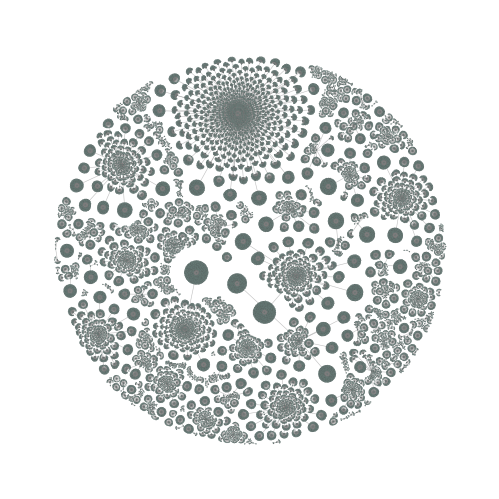

In [93]:
stylized_network, config = nw.visualize(G)

positions_hierarchic = {}
for node in stylized_network['nodes']:
    node_id = node['id']  # This is the node name, like 'PMID:123456'
    positions_hierarchic[node_id] = (node['x'], node['y'])

nw.save("netwulf_network_publications_hierarchical.json", stylized_network, config, G)

In [99]:
pos_df_hier = pd.DataFrame([
    {'pmid': key.replace('PMID:', ''), 'x_hier_slp': x, 'y_hier_slp': y}
    for key, (x, y) in positions_hierarchic.items()
    if key.startswith('PMID:')
])
pos_df_hier['pmid'] = pos_df_hier['pmid'].astype(int)
df_with_pos = df_gene_path_min.merge(pos_df_hier, on='pmid', how='left')


In [101]:
#df_with_pos = polar_layout(df_gene_path_min)

In [103]:
df_with_pos.head()

,pmid,pmid_title,pmid_title_gene,gene,highest_level_path,x_hier_slp,y_hier_slp
0,7866404,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,Developmental Biology,-1301.951846,97.890628
1,7866411,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,Metabolism,824.500676,1853.023085
2,7868125,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,Signal Transduction,2242.544708,-536.792681
3,7870075,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,Metabolism of Proteins,47.262107,765.939823
4,7874109,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,Developmental Biology,-1399.858573,-187.992068


In [107]:
#df_with_pos.to_csv("dataset_with_x_y_path_gene_article.csv")

<InteractiveFigure width=100% height=800>
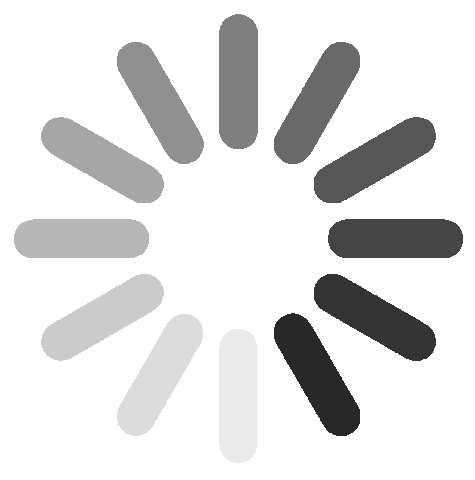

In [105]:
xy= df_with_pos[["x_hier_slp", "y_hier_slp"]].values
label_array = df_with_pos["highest_level_path"].values
pmid_title = df_with_pos["pmid_title_gene"].values
genes_array = df_with_pos["gene"].values

xy_min = xy.min()
xy_max = xy.max()

xy_scaled_hier = -12 + ((xy - xy_min) / (xy_max - xy_min)) * (12 - (-12))

dmp.create_interactive_plot(
    xy_scaled_hier,
    label_array,
    genes_array,
    hover_text=pmid_title,
    enable_search=True,
)

In [ ]:
def polar_layout(df,
                 weight="pmid",           # or "gene"
                 r_inner=4.0,
                 r_outer=16.0,
                 r_gene =1.8,
                 r_pmid =0.35,
                 gap    =1.4,             # > 1 → more empty space
                 seed   =0):
    """
    Adds x_hier / y_hier columns for a speed‑O(n) hierarchical layout.

    * Pathway radius  = linear map(size,  r_inner … r_outer)
    * Pathway angle   = cumulative arc  proportional to size × gap
    * Gene  radius    = r_gene  from its pathway centre
    * PMID  jitter    = Gaussian σ=r_pmid  around its gene centre
    """
    rnd = np.random.default_rng(seed)

    # -------------------------------------------------------------
    # 0 . weights per pathway
    # -------------------------------------------------------------
    if weight == "pmid":
        sizes = df.groupby("highest_level_path").size()
    elif weight == "gene":
        sizes = df.groupby("highest_level_path")["gene"].nunique()
    else:
        raise ValueError("weight must be 'pmid' or 'gene'")

    sizes = sizes.sort_values(ascending=False)
    pnames, ws = sizes.index.to_numpy(), sizes.to_numpy(dtype=float)

    # -------------------------------------------------------------
    # 1 . map sizes → radii  (bigger → closer to centre)
    # -------------------------------------------------------------
    w_min, w_max = ws[-1], ws[0]
    r = r_outer - (ws - w_min) / (w_max - w_min + 1e-9) * (r_outer - r_inner)
    pathway_radii = dict(zip(pnames, r))

    # -------------------------------------------------------------
    # 2 . angular allocation with gap factor
    # -------------------------------------------------------------
    arc_lengths = gap * ws / ws.sum() * 2 * np.pi
    theta_start = np.concatenate(([0], np.cumsum(arc_lengths[:-1])))
    thetas      = theta_start + arc_lengths / 2          # centre of each arc
    pathway_angles = dict(zip(pnames, thetas))

    # -------------------------------------------------------------
    # 3 . gene centres  (small circle round pathway)
    # -------------------------------------------------------------
    gene_xy = {}
    for p in pnames:
        g_subset = df[df["highest_level_path"] == p]["gene"].unique()
        n_g      = len(g_subset)
        # spread genes evenly *within the pathway's private arc*
        base = pathway_angles[p] - arc_lengths[pnames == p][0] / 2
        for k, g in enumerate(sorted(g_subset)):
            theta_g = base + (k + 0.5) / n_g * arc_lengths[pnames == p][0]
            rp      = pathway_radii[p]
            gene_xy[g] = (rp * np.cos(theta_g), rp * np.sin(theta_g))

    # -------------------------------------------------------------
    # 4 . place every PMID  (small jitter cloud)
    # -------------------------------------------------------------
    xs, ys = [], []
    for _, row in df.iterrows():
        gx, gy = gene_xy[row["gene"]]
        dx, dy = rnd.normal(scale=r_pmid, size=2)
        xs.append(gx + dx)
        ys.append(gy + dy)

    df["x_hier"] = xs
    df["y_hier"] = ys
    return df


In [299]:
df_pubs['gene symbol'] = df_pubs['gene symbol'].fillna('unlabeled')

df_pubs["x_nw_cluster"] = xy_scaled[:, 0]
df_pubs["y_nw_cluster"] = xy_scaled[:, 1]

df_pubs["x_nw_cluster_hier"] = xy_scaled_hier[:, 0]
df_pubs["y_nw_cluster_hier"] = xy_scaled_hier[:, 1]
df_pubs = df_pubs.drop(columns=['Unnamed: 0'])

df_pubs.head()

,pmid,title,pmid_title,gene symbol,gene,highest_level_path,highest_level_path_filt,journal,pub_type,pub_year,assigned_color,x,y,x_nw_cluster,y_nw_cluster,x_nw_cluster_hier,y_nw_cluster_hier
0,535897,Partial trisomy 7q and probable partial monoso...,535897: Partial trisomy 7q and probable partia...,SON,gene missing,unlabeled,NaN,Human genetics,"['Case Reports', 'Journal Article']",1979,lightgray,96.833522,-68.642002,0.510348,-6.839863,0.951952,-5.610262
1,1189520,Studies of malformation syndromes in man XXXX:...,1189520: Studies of malformation syndromes in ...,SON,gene missing,unlabeled,NaN,Zeitschrift fur Kinderheilkunde,"['Journal Article', ""Research Support, U.S. Go...",1975,lightgray,57.733299,-22.418637,0.074410,-6.582701,1.480823,-5.482832
2,1338906,Constitutional mutations in the WT1 gene in pa...,1338906: Constitutional mutations in the WT1 g...,WT1,WT1,Developmental Biology,Developmental Biology,Human molecular genetics,"['Journal Article', ""Research Support, Non-U.S...",1992,#FFB500,81.086293,21.990513,-4.059861,-5.130109,10.162711,-4.595895
3,1487248,Mutations in the conserved domain of SRY are u...,1487248: Mutations in the conserved domain of ...,SRY,SRY,Signal Transduction,Developmental Biology,Human genetics,"['Journal Article', ""Research Support, Non-U.S...",1992,#aeaa00,102.043327,-62.847098,-4.346817,3.853647,-2.726039,0.526401
4,1749685,Chondroosseous dysplasia in severe combined im...,1749685: Chondroosseous dysplasia in severe co...,ADA,ADA,Metabolism,Diseases of metabolism,Pediatric radiology,"['Case Reports', 'Journal Article']",1991,#1CE6FF,-1.512753,-46.540196,3.647811,2.974923,-1.316927,8.880455


In [301]:
df_pubs.to_csv("data_for_dashboard_articles.csv",index=False)

In [304]:
df2 = pd.read_csv("data_for_dashboard_gene_paths_with_common.csv")

In [306]:
filtered_df = df2
filtered_df = filtered_df[filtered_df['highest_level_path'] == "Immune System"]

In [310]:
filtered_df
xy_scaled = filtered_df[["x", "y"]].values

## cluster disease focused

In [165]:
df_gene_path_dis

,pmid,title,pmid_title_gene,pmid_title,gene,g2p_diseases
0,7866404,Autosomal dominant spondylarthropathy due to a...,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,G2P00037: COL2A1-related Kniest dysplasia;G2P0...
1,7866411,Phenylketonuria in southern Poland: a new spli...,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,G2P00275: PAH-related non-phenylketonuria hype...
2,7868125,Elongated CAG repeats of the B37 gene in a Dan...,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,"G2P02647: ATN1-related congenital hypotonia, e..."
3,7870075,A novel mutation in the fibrillin gene (FBN1) ...,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,G2P01013: FBN1-related Marfan syndrome;G2P0156...
4,7874109,RET proto-oncogene mutations in French MEN 2A ...,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,G2P00680: RET-related multiple endocrine neopl...
...,...,...,...,...,...,...
47804,1540342,"Infections of the ears, nose, and throat in ch...","1540342: Infections of the ears, nose, and thr...","1540342: Infections of the ears, nose, and thr...",EPRS1,G2P02598: EPRS1-related hypomyelinating leukod...
47805,1543219,Ocular histopathologic characteristics of coba...,1543219: Ocular histopathologic characteristic...,1543219: Ocular histopathologic characteristic...,NDUFB3,G2P03140: NDUFB3-related mitochondrial complex...
47806,1544217,The interstitial deletion of bands q33-35 of l...,1544217: The interstitial deletion of bands q3...,1544217: The interstitial deletion of bands q3...,ARMC9,G2P02085: ARMC9-related Joubert syndrome
47807,1551678,Frequency of the delta F508 deletion and G551D...,1551678: Frequency of the delta F508 deletion ...,1551678: Frequency of the delta F508 deletion ...,YY1,G2P00744: YY1-related intellectual disability


In [286]:
import re

def clean_disease(text):
    if pd.isna(text) or text.lower() == 'unlabeled':
        return 'Unlabeled'

    text = str(text).strip()

    # Step 1: If "-Onset" is in the text, get the first word after it
    match = re.search(r'\b\w+-Onset\s+(\w+)', text, flags=re.IGNORECASE)
    if match:
        return match.group(1).strip().title()

    # Step 2: Extract after colon (if present)
    after_colon = text.split(':', 1)[-1].strip()

    # Step 3: Remove leading gene name or "-related"
    after_gene = re.sub(r'^\w+(?:-related)?\s+', '', after_colon, flags=re.IGNORECASE)

    # Step 4: Cut off anything after "with"
    main_disease = re.split(r'\s+with\s+', after_gene, flags=re.IGNORECASE)[0]

    # Step 5: Title case
    disease = main_disease.strip().title()

    # Step 6: If ends with a comma and looks like reversed label, flip it
    if disease.endswith(','):
        parts = disease[:-1].split(',')
        if len(parts) == 2:
            disease = f"{parts[1].strip()} {parts[0].strip()}"

    return disease

In [376]:
df_gene_path_dis = df_gene_path[['pmid', 'title', 'pmid_title_gene', 'pmid_title', 'gene', 'g2p_diseases', 'pubdate','journal']]
df_gene_path_dis['g2p_diseases'] = df_gene_path_dis['g2p_diseases'].fillna('unlabeled')
df_gene_path_dis['g2p_diseases_first'] = df_gene_path_dis['g2p_diseases'].apply(lambda x: str(x).split(";")[0])

df_gene_path_dis['disease'] = df_gene_path_dis['g2p_diseases_first'].apply(clean_disease)
df_gene_path_dis['pmid_title_disease'] = df_gene_path_dis.apply(
    lambda row: f"{row['pmid']}: {row['title']}; Gene: {row['gene']}; Disease: {row['disease']}",
    axis=1
)

/var/folders/nd/2fzvhsh510gbt9x6z5pdb1gr0000gn/T/ipykernel_37302/688248429.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gene_path_dis['g2p_diseases'] = df_gene_path_dis['g2p_diseases'].fillna('unlabeled')
/var/folders/nd/2fzvhsh510gbt9x6z5pdb1gr0000gn/T/ipykernel_37302/688248429.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gene_path_dis['g2p_diseases_first'] = df_gene_path_dis['g2p_diseases'].apply(lambda x: str(x).split(";")[0])
/var/folders/nd/2fzvhsh510gbt9x6z5pdb1gr0000gn/T/ipykernel

In [401]:
pmid = 34003371
#pmid = 31148362

result = df_gene_path_dis[df_gene_path_dis['pmid'] == pmid][['pmid','title','gene','g2p_diseases']]

for _, row in result.iterrows():
    print(f"PMID: {row['pmid']}")
    print(f"Title: {row['title']}")
    print(f"Gene: {row['gene']}")
    print(f"Disease: {row['g2p_diseases']}")
    print('---')

PMID: 34003371
Title: Pediatric LGI1 and CASPR2 autoimmunity associated with COVID 19: Morvan syndrome.
Gene: CNTNAP2
Disease: G2P00173: CNTNAP2-related cortical dysplasia-focal epilepsy syndrome
---


In [346]:
df_gene_path_dis[df_gene_path_dis['disease'] == 'Disorder']

,pmid,title,pmid_title_gene,pmid_title,gene,g2p_diseases,g2p_diseases_first,disease,pmid_title_disease
799,26751646,Identification of two novel ALS2 mutations in ...,26751646: Identification of two novel ALS2 mut...,26751646: Identification of two novel ALS2 mut...,ALS2,G2P00686: ALS2-related disorder,G2P00686: ALS2-related disorder,Disorder,26751646: Identification of two novel ALS2 mut...
1892,25631098,Novel mutations in the PNPLA6 gene in Boucher-...,25631098: Novel mutations in the PNPLA6 gene i...,25631098: Novel mutations in the PNPLA6 gene i...,PNPLA6,G2P02980: PNPLA6-related disorder,G2P02980: PNPLA6-related disorder,Disorder,25631098: Novel mutations in the PNPLA6 gene i...
2261,30555943,Gordon Holmes syndrome due to compound heteroz...,30555943: Gordon Holmes syndrome due to compou...,30555943: Gordon Holmes syndrome due to compou...,PNPLA6,G2P02980: PNPLA6-related disorder,G2P02980: PNPLA6-related disorder,Disorder,30555943: Gordon Holmes syndrome due to compou...
4810,30097146,A new PNPLA6 mutation presenting as Oliver McF...,30097146: A new PNPLA6 mutation presenting as ...,30097146: A new PNPLA6 mutation presenting as ...,PNPLA6,G2P02980: PNPLA6-related disorder,G2P02980: PNPLA6-related disorder,Disorder,30097146: A new PNPLA6 mutation presenting as ...
6245,32607449,A splice variant in ATAD3A expands the clinica...,32607449: A splice variant in ATAD3A expands t...,32607449: A splice variant in ATAD3A expands t...,ATAD3A,G2P01760: ATAD3A-related disorder with global ...,G2P01760: ATAD3A-related disorder with global ...,Disorder,32607449: A splice variant in ATAD3A expands t...
...,...,...,...,...,...,...,...,...,...
43959,33141049,Novel variants in PNPLA6 causing syndromic ret...,33141049: Novel variants in PNPLA6 causing syn...,33141049: Novel variants in PNPLA6 causing syn...,PNPLA6,G2P02980: PNPLA6-related disorder,G2P02980: PNPLA6-related disorder,Disorder,33141049: Novel variants in PNPLA6 causing syn...
44979,28158749,ATPase-deficient mitochondrial inner membrane ...,28158749: ATPase-deficient mitochondrial inner...,28158749: ATPase-deficient mitochondrial inner...,ATAD3A,G2P01760: ATAD3A-related disorder with global ...,G2P01760: ATAD3A-related disorder with global ...,Disorder,28158749: ATPase-deficient mitochondrial inner...
45507,18810511,Maternal uniparental heterodisomy with partial...,18810511: Maternal uniparental heterodisomy wi...,18810511: Maternal uniparental heterodisomy wi...,ALS2,G2P00686: ALS2-related disorder,G2P00686: ALS2-related disorder,Disorder,18810511: Maternal uniparental heterodisomy wi...
46708,29248984,Different Cerebellar Ataxia Phenotypes Associa...,29248984: Different Cerebellar Ataxia Phenotyp...,29248984: Different Cerebellar Ataxia Phenotyp...,PNPLA6,G2P02980: PNPLA6-related disorder,G2P02980: PNPLA6-related disorder,Disorder,29248984: Different Cerebellar Ataxia Phenotyp...


In [292]:
df_gene_path_dis.head()

,pmid,title,pmid_title_gene,pmid_title,gene,g2p_diseases,g2p_diseases_first,disease,pmid_title_disease
0,7866404,Autosomal dominant spondylarthropathy due to a...,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,G2P00037: COL2A1-related Kniest dysplasia;G2P0...,G2P00037: COL2A1-related Kniest dysplasia,Kniest Dysplasia,7866404: Autosomal dominant spondylarthropathy...
1,7866411,Phenylketonuria in southern Poland: a new spli...,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,G2P00275: PAH-related non-phenylketonuria hype...,G2P00275: PAH-related non-phenylketonuria hype...,Non-Phenylketonuria Hyperphenylalaninemia,7866411: Phenylketonuria in southern Poland: a...
2,7868125,Elongated CAG repeats of the B37 gene in a Dan...,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,"G2P02647: ATN1-related congenital hypotonia, e...","G2P02647: ATN1-related congenital hypotonia, e...","Congenital Hypotonia, Epilepsy, Developmental ...",7868125: Elongated CAG repeats of the B37 gene...
3,7870075,A novel mutation in the fibrillin gene (FBN1) ...,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,G2P01013: FBN1-related Marfan syndrome;G2P0156...,G2P01013: FBN1-related Marfan syndrome,Marfan Syndrome,7870075: A novel mutation in the fibrillin gen...
4,7874109,RET proto-oncogene mutations in French MEN 2A ...,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,G2P00680: RET-related multiple endocrine neopl...,G2P00680: RET-related multiple endocrine neopl...,Multiple Endocrine Neoplasia Iib,7874109: RET proto-oncogene mutations in Frenc...


In [294]:
df_gene_path_dis.disease.nunique()

1368

In [296]:
df_gene_path_dis['disease'].value_counts()

disease
Intellectual Developmental Disorder                                     1088
Intellectual Disability                                                 1081
Marfan Syndrome                                                          850
Neurodevelopmental Disorder                                              795
Adrenoleukodystrophy                                                     747
                                                                        ... 
Pyruvate Dehydrogenase E2 Deficiency                                       1
Hypopituitarism, Post-Natal Microcephaly, Visual And Renal Anomalies       1
Congenital Myaesthenia                                                     1
Gomez-Lopez-Fernandes Syndrome                                             1
Mitochondrial Dna Depletion/Deletions Syndrome                             1
Name: count, Length: 1368, dtype: int64

In [298]:
df_gene_path_dis.g2p_diseases_first.nunique()

2355

In [300]:
df_gene_path_dis['g2p_diseases_first'].value_counts()

g2p_diseases_first
G2P01013: FBN1-related Marfan syndrome                                                                          850
G2P00786: ABCD1-related adrenoleukodystrophy                                                                    747
G2P00410: NF1-related neurofibromatosis                                                                         533
G2P00034: MECP2-related Rett syndrome                                                                           397
G2P01542: NOTCH3-related infantile myofibromatosis                                                              363
                                                                                                               ... 
G2P03562: ZSCAN10-related neurodevelopmental disorder with oto-facial malformations                               1
G2P03547: DENND5B-related neurodevelopmental disorder with cortical migration and white matter abnormalities      1
G2P00630: ZBTB16-related skeletal defects, genital hy

In [302]:
# Step 1: Get counts
dis_counts = df_gene_path_dis['disease'].value_counts()

# Step 2: Identify values with count < 2
rare_values = dis_counts[dis_counts < 10].index

rare_values

Index(['Diabetes Mellitus, Transient Neonatal',
       'Malonyl-Coa Decarboxylase Deficiency',
       'Neurologic, Endocrine, And Pancreatic Disease, Multisystem, Infantile-Onset',
       'Myopathy Myofibrillar', 'Chondrodysplasia',
       'Rickets Vitamin D-Dependent',
       'Shprintzen-Goldberg Craniosynostosis Syndrome',
       'Arterial Tortuosity Syndrome',
       'Neuropathy, Hereditary Sensory And Autonomic',
       'Trichothiodystrophy Photosensitive',
       ...
       'Severe Neurodevelopmental Syndrome',
       'Early-Infantile Neurological Disorder',
       'Ataxia, Intention Tremor, And Hypotonia Syndrome',
       'Microcephaly, Developmental Delay, And Brittle Hair And Nails',
       'Skeletal Defects, Genital Hypoplasia, And Intellectual Developmental Disorder',
       'Pyruvate Dehydrogenase E2 Deficiency',
       'Hypopituitarism, Post-Natal Microcephaly, Visual And Renal Anomalies',
       'Congenital Myaesthenia', 'Gomez-Lopez-Fernandes Syndrome',
       'Mitochondr

In [304]:
# Step 2: Set paths with < 100 PMIDs to "unlabeled"
#df_gene_path_dis['g2p_diseases_first'] = df_gene_path_dis['g2p_diseases_first'].apply(
 #   lambda x: x if dis_counts.get(x, 0) >= 10 else 'Low count'
#)

In [306]:
df_gene_path_dis.gene.nunique()

2355

In [308]:
df_gene_path_dis[df_gene_path_dis['disease'].str.contains('epilepsy', case=False, na=False)]['disease'].value_counts()

disease
Benign Neonatal Epilepsy                                                                                                134
Epilepsy                                                                                                                 65
Epilepsy And Intellectual Disability                                                                                     60
Intellectual Disability And Epilepsy                                                                                     53
Familial Focal Epilepsy                                                                                                  53
Focal Epilepsy                                                                                                           53
Congenital Hypotonia, Epilepsy, Developmental Delay, Digit Abnormalities                                                 42
Pyridoxine-Dependent Epilepsy                                                                                            42


In [310]:
disease_counts = (
    df_gene_path_dis.groupby('disease')
    .agg(
        num_genes=('gene', 'nunique'),
        num_pmids=('pmid', 'nunique')
    )
    .sort_values(by='num_genes', ascending=False)
)
# Filter to genes linked to more than one disease
disease_counts

,num_genes,num_pmids
disease,,
Neurodevelopmental Disorder,156,795
Developmental Disorder,78,741
Intellectual Developmental Disorder,76,1088
Intellectual Disability,56,1081
Congenital Disorder Of Glycosylation,34,335
...,...,...
"Global Developmental Delay, Hypotonia, Scoliosis, And Cerebellar Atrophy",1,8
Global Developmental Delay,1,15
Glass Syndrome,1,50


In [326]:
gene_counts = (
    df_gene_path_dis.groupby('gene')
    .agg(
        num_diseases=('disease', 'nunique')
    )
    .sort_values(by='num_diseases', ascending=False)
)
# Filter to genes linked to more than one disease
gene_counts

,num_diseases
gene,
AAAS,1
PMM2,1
PLAG1,1
PLCB1,1
PLCB4,1
...,...
GABBR2,1
GABRA1,1
GABRA2,1


In [312]:
G = nx.Graph()

for _, row in df_gene_path_dis.iterrows():
    pmid_node = f"PMID:{row['pmid']}"
    gene_node = f"Gene:{row['gene']}"
    disease_node = f"Disease:{row['disease']}"

    G.add_node(pmid_node, type='PMID', title=row['pmid_title'])
    G.add_node(gene_node, type='Gene', label=row['gene'])
    G.add_node(disease_node, type='Disease', label=row['disease'])

    G.add_edge(pmid_node, gene_node, label='mentions_gene')
    #G.add_edge(pmid_node, disease_node, label='mentions_gene')
    G.add_edge(gene_node, disease_node, label='assoc_with_disease')

/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(
/opt/anaconda3/envs/gene-pathway-viz/lib/python3.13/site-packages/networkx/readwrite/json_graph/node_link.py:142: FutureWarning: 
The default value will be `edges="edges" in NetworkX 3.6.

To make this warning go away, explicitly set the edges kwarg, e.g.:

  nx.node_link_data(G, edges="links") to preserve current behavior, or
  nx.node_link_data(G, edges="edges") for forward compatibility.
  warnings.warn(


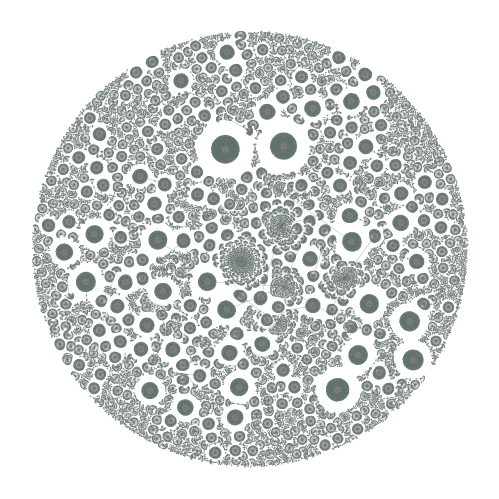

In [314]:
stylized_network, config = nw.visualize(G)

positions_hierarchic = {}
for node in stylized_network['nodes']:
    node_id = node['id']  # This is the node name, like 'PMID:123456'
    positions_hierarchic[node_id] = (node['x'], node['y'])

nw.save("netwulf_network_publications_hierarchical.json", stylized_network, config, G)

In [378]:
pos_df_hier = pd.DataFrame([
    {'pmid': key.replace('PMID:', ''), 'x_hier_dis': x, 'y_hier_dis': y}
    for key, (x, y) in positions_hierarchic.items()
    if key.startswith('PMID:')
])
pos_df_hier['pmid'] = pos_df_hier['pmid'].astype(int)
df_with_pos = df_gene_path_dis.merge(pos_df_hier, on='pmid', how='left')


In [368]:
df_with_pos.head()

,pmid,title,pmid_title_gene,pmid_title,gene,g2p_diseases,pubdate,journal,g2p_diseases_first,disease,x_hier_dis,y_hier_dis
0,7866404,Autosomal dominant spondylarthropathy due to a...,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,G2P00037: COL2A1-related Kniest dysplasia;G2P0...,1994,Human mutation,G2P00037: COL2A1-related Kniest dysplasia,Kniest Dysplasia,-847.679505,958.268920
1,7866411,Phenylketonuria in southern Poland: a new spli...,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,G2P00275: PAH-related non-phenylketonuria hype...,1994,Human mutation,G2P00275: PAH-related non-phenylketonuria hype...,Non-Phenylketonuria Hyperphenylalaninemia,-181.165543,1344.294083
2,7868125,Elongated CAG repeats of the B37 gene in a Dan...,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,"G2P02647: ATN1-related congenital hypotonia, e...",1995,Human genetics,"G2P02647: ATN1-related congenital hypotonia, e...","Congenital Hypotonia, Epilepsy, Developmental ...",-137.169187,-945.631471
3,7870075,A novel mutation in the fibrillin gene (FBN1) ...,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,G2P01013: FBN1-related Marfan syndrome;G2P0156...,1994,Molecular and cellular probes,G2P01013: FBN1-related Marfan syndrome,Marfan Syndrome,184.810106,-520.792097
4,7874109,RET proto-oncogene mutations in French MEN 2A ...,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,G2P00680: RET-related multiple endocrine neopl...,1994,Human molecular genetics,G2P00680: RET-related multiple endocrine neopl...,Multiple Endocrine Neoplasia Iib,2199.387504,237.979398


<InteractiveFigure width=100% height=800>
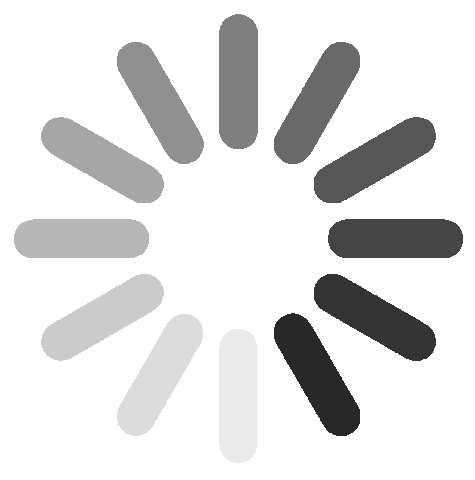

In [320]:
xy= df_with_pos[["x_hier_dis", "y_hier_dis"]].values
label_array = df_with_pos["disease"].values
pmid_title = df_with_pos["pmid_title_disease"].values
genes_array = df_with_pos["gene"].values

xy_min = xy.min()
xy_max = xy.max()

xy_scaled_hier = -12 + ((xy - xy_min) / (xy_max - xy_min)) * (12 - (-12))

dmp.create_interactive_plot(
    xy_scaled_hier,
    label_array,
    genes_array,
    hover_text=pmid_title,
    enable_search=True,
)

In [370]:
df_with_pos_gene_path = pd.read_csv("dataset_with_x_y_path_gene_article.csv")

In [372]:
df_with_pos_gene_path.head()

,Unnamed: 0,pmid,pmid_title,pmid_title_gene,gene,highest_level_path,x_hier_hlp,y_hier_hlp
0,0,7866404,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,Developmental Biology,-704.737437,443.527275
1,1,7866411,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,Metabolism,317.632179,-1272.980319
2,2,7868125,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,Signal Transduction,632.140580,-2027.384203
3,3,7870075,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,Metabolism of Proteins,1975.621416,-1166.041557
4,4,7874109,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,Developmental Biology,2807.241835,-414.679183


In [384]:
df_with_pos_all = df_with_pos_gene_path.merge(df_with_pos[['pmid','disease','pmid_title_disease','pubdate','journal','x_hier_dis','y_hier_dis']], on='pmid', how='left')
df_with_pos_all = df_with_pos_all.drop(columns=['Unnamed: 0'])

df_with_pos_all

,pmid,pmid_title,pmid_title_gene,gene,highest_level_path,x_hier_hlp,y_hier_hlp,disease,pmid_title_disease,pubdate,journal,x_hier_dis,y_hier_dis
0,7866404,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,Developmental Biology,-704.737437,443.527275,Kniest Dysplasia,7866404: Autosomal dominant spondylarthropathy...,1994,Human mutation,-847.679505,958.268920
1,7866411,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,Metabolism,317.632179,-1272.980319,Non-Phenylketonuria Hyperphenylalaninemia,7866411: Phenylketonuria in southern Poland: a...,1994,Human mutation,-181.165543,1344.294083
2,7868125,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,Signal Transduction,632.140580,-2027.384203,"Congenital Hypotonia, Epilepsy, Developmental ...",7868125: Elongated CAG repeats of the B37 gene...,1995,Human genetics,-137.169187,-945.631471
3,7870075,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,Metabolism of Proteins,1975.621416,-1166.041557,Marfan Syndrome,7870075: A novel mutation in the fibrillin gen...,1994,Molecular and cellular probes,184.810106,-520.792097
4,7874109,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,Developmental Biology,2807.241835,-414.679183,Multiple Endocrine Neoplasia Iib,7874109: RET proto-oncogene mutations in Frenc...,1994,Human molecular genetics,2199.387504,237.979398
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44503,1540342,"1540342: Infections of the ears, nose, and thr...","1540342: Infections of the ears, nose, and thr...",EPRS1,Metabolism,-621.941304,-525.793135,Hypomyelinating Leukodystrophy,"1540342: Infections of the ears, nose, and thr...",1992,Archives of otolaryngology--head & neck surgery,1384.618946,1379.290128
44504,1543219,1543219: Ocular histopathologic characteristic...,1543219: Ocular histopathologic characteristic...,NDUFB3,Metabolism,-866.081257,238.045864,Mitochondrial Complex I Deficiency,1543219: Ocular histopathologic characteristic...,1992,American journal of ophthalmology,-145.042889,387.501680
44505,1544217,1544217: The interstitial deletion of bands q3...,1544217: The interstitial deletion of bands q3...,ARMC9,unlabeled,2397.253175,1597.906770,Joubert Syndrome,1544217: The interstitial deletion of bands q3...,1992,Clinical genetics,-576.161553,411.817669
44506,1551678,1551678: Frequency of the delta F508 deletion ...,1551678: Frequency of the delta F508 deletion ...,YY1,Developmental Biology,-483.674649,740.023594,Intellectual Disability,1551678: Frequency of the delta F508 deletion ...,1992,Human genetics,31.892266,806.137024


In [393]:
df_with_pos_all = scale_xy(df_with_pos_all, "x_hier_hlp", "y_hier_hlp")
df_with_pos_all = scale_xy(df_with_pos_all, "x_hier_dis", "y_hier_dis")
df_with_pos_all

,pmid,pmid_title,pmid_title_gene,gene,highest_level_path,x_hier_hlp,y_hier_hlp,disease,pmid_title_disease,pubdate,journal,x_hier_dis,y_hier_dis
0,7866404,7866404: Autosomal dominant spondylarthropathy...,7866404: Autosomal dominant spondylarthropathy...,COL2A1,Developmental Biology,-5.724144,-0.349289,Kniest Dysplasia,7866404: Autosomal dominant spondylarthropathy...,1994,Human mutation,-6.958755,2.211097
1,7866411,7866411: Phenylketonuria in southern Poland: a...,7866411: Phenylketonuria in southern Poland: a...,PAH,Metabolism,-0.938585,-8.384003,Non-Phenylketonuria Hyperphenylalaninemia,7866411: Phenylketonuria in southern Poland: a...,1994,Human mutation,-3.574475,4.171172
2,7868125,7868125: Elongated CAG repeats of the B37 gene...,7868125: Elongated CAG repeats of the B37 gene...,ATN1,Signal Transduction,0.533581,-11.915254,"Congenital Hypotonia, Epilepsy, Developmental ...",7868125: Elongated CAG repeats of the B37 gene...,1995,Human genetics,-3.351080,-7.456114
3,7870075,7870075: A novel mutation in the fibrillin gen...,7870075: A novel mutation in the fibrillin gen...,FBN1,Metabolism of Proteins,6.822212,-7.883439,Marfan Syndrome,7870075: A novel mutation in the fibrillin gen...,1994,Molecular and cellular probes,-1.716204,-5.298957
4,7874109,7874109: RET proto-oncogene mutations in Frenc...,7874109: RET proto-oncogene mutations in Frenc...,RET,Developmental Biology,10.714902,-4.366425,Multiple Endocrine Neoplasia Iib,7874109: RET proto-oncogene mutations in Frenc...,1994,Human molecular genetics,8.512979,-1.446232
...,...,...,...,...,...,...,...,...,...,...,...,...,...
44503,1540342,"1540342: Infections of the ears, nose, and thr...","1540342: Infections of the ears, nose, and thr...",EPRS1,Metabolism,-5.336587,-4.886532,Hypomyelinating Leukodystrophy,"1540342: Infections of the ears, nose, and thr...",1992,Archives of otolaryngology--head & neck surgery,4.375925,4.348867
44504,1543219,1543219: Ocular histopathologic characteristic...,1543219: Ocular histopathologic characteristic...,NDUFB3,Metabolism,-6.479370,-1.311117,Mitochondrial Complex I Deficiency,1543219: Ocular histopathologic characteristic...,1992,American journal of ophthalmology,-3.391059,-0.687021
44505,1544217,1544217: The interstitial deletion of bands q3...,1544217: The interstitial deletion of bands q3...,ARMC9,unlabeled,8.795807,5.054187,Joubert Syndrome,1544217: The interstitial deletion of bands q3...,1992,Clinical genetics,-5.580100,-0.563554
44506,1551678,1551678: Frequency of the delta F508 deletion ...,1551678: Frequency of the delta F508 deletion ...,YY1,Developmental Biology,-4.689382,1.038565,Intellectual Disability,1551678: Frequency of the delta F508 deletion ...,1992,Human genetics,-2.492657,1.438635


In [395]:
df_with_pos_all.to_csv("df_with_pos_all.csv", index=False)